In [ ]:
!pip install kaggle

In [ ]:
import json

kaggle_config = {
    'username': 'hzhang09',
    'key': 'KGAT_43b5093a465835ede99d6165ca536b0f'
}

with open("kaggle.json", "w") as f:
    json.dump(kaggle_config, f)

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d steubk/wikiart
!unzip -q wikiart.zip -d wikiart_data

Dataset URL: https://www.kaggle.com/datasets/steubk/wikiart
License(s): CC0-1.0
wikiart.zip: Skipping, found more recently modified local copy (use --force to force download)
replace wikiart_data/Abstract_Expressionism/aaron-siskind_acolman-1-1955.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
import os
from glob import glob

base_path = "wikiart_data"

image_paths = []
extensions = ("*.jpg", "*.jpeg", "*.png")

for ext in extensions:
    image_paths.extend(glob(os.path.join(base_path, "**", ext), recursive=True))

# Lets use a sub-dataset(first 5,000)
image_paths = image_paths[:5000]
print("Total images found:", len(image_paths))

print("Using images:", len(image_paths))
print("Example path:", image_paths[0])

Total images found: 5000
Using images: 5000
Example path: wikiart_data/Analytical_Cubism/juan-gris_still-life-with-flowers-1912.jpg


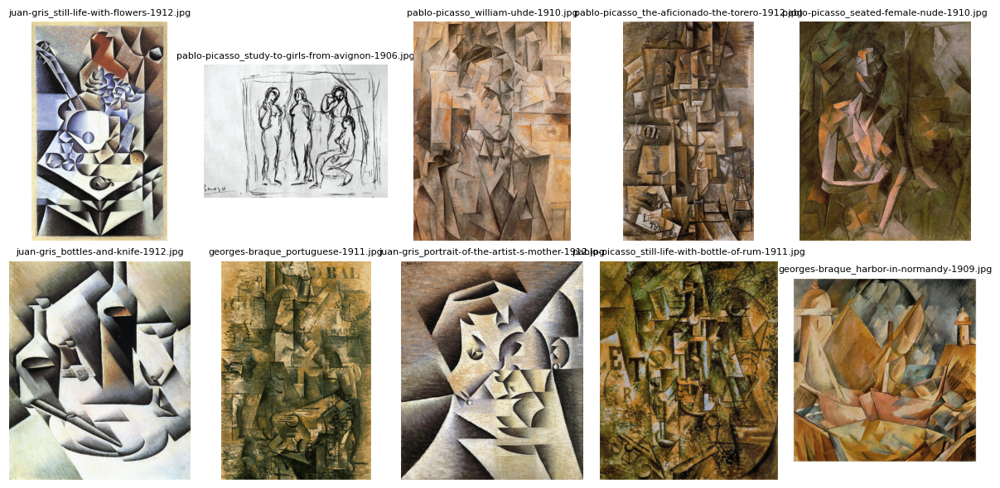

In [ ]:
from PIL import Image
import matplotlib.pyplot as plt

# display a few example images first 10 images
sample_paths = image_paths[:10]

fig, axes = plt.subplots(2, 5, figsize=(12, 6))

for ax, img_path in zip(axes.ravel(), sample_paths):
    img = Image.open(img_path).convert("RGB")
    ax.imshow(img)
    ax.set_title(os.path.basename(img_path), fontsize=8)
    ax.axis("off")

plt.tight_layout()
plt.show()

Use CLIP for Image Embeddings (reference: https://github.com/Pdbz199/CLIP-decomposition)

In [ ]:
!pip install open_clip_torch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 64.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 2.7 MB/s eta 0:00:00


In [ ]:
import torch
import open_clip
import numpy as np
from tqdm import tqdm

#should use GPU if available
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device)

clip_model, _, preprocess = open_clip.create_model_and_transforms(
    "ViT-B-32",
    pretrained="openai"
)

clip_model = clip_model.to(device)
clip_model.eval()

embeddings = []
valid_image_paths = []

for img_path in tqdm(image_paths):
    try:
        image = Image.open(img_path).convert("RGB")
        img_tensor = preprocess(image).unsqueeze(0).to(device)

        with torch.no_grad():
            img_embedding = clip_model.encode_image(img_tensor)

        img_embedding = img_embedding / img_embedding.norm(dim=-1, keepdim=True)

        embeddings.append(img_embedding.cpu().numpy()[0])
        valid_image_paths.append(img_path)

    except Exception as e:
        print("Skipped image:", img_path)
        print("Reason:", e)

embeddings = np.array(embeddings)

print("Embeddings shape:", embeddings.shape)
print("Valid images:", len(valid_image_paths))

Using device: cpu


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


open_clip_model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/open_clip/factory.py:450: UserWarning: QuickGELU mismatch between final model config (quick_gelu=False) and pretrained tag 'openai' (quick_gelu=True).
  warnings.warn(
100%|██████████| 5000/5000 [24:02<00:00,  3.47it/s]

Embeddings shape: (5000, 512)
Valid images: 5000


Apply Umap to lower 3 dimenionsality to help with the future data visualization step

In [ ]:
!pip install umap-learn

In [ ]:
import umap

reducer = umap.UMAP(
    n_components=3,
    n_neighbors=15,
    min_dist=0.1,
    metric="cosine",
    random_state=42
)

embedding_3d = reducer.fit_transform(embeddings)

print(embedding_3d.shape)

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


(5000, 3)


Use Plotly for 3D visualization

In [ ]:
!pip install plotly

In [ ]:
import plotly.express as px
import pandas as pd
import os

df = pd.DataFrame({
    "x": embedding_3d[:, 0],
    "y": embedding_3d[:, 1],
    "z": embedding_3d[:, 2],
    "image": [os.path.basename(p) for p in valid_image_paths],
    "path": valid_image_paths
})

fig = px.scatter_3d(
    df,
    x="x",
    y="y",
    z="z",
    hover_name="image",
    title="3D UMAP Visualization of Artwork Embeddings"
)

fig.show()

Add clustering with HDBSCAN

In [ ]:
!pip install hdbscan

In [ ]:
import hdbscan

clusterer = hdbscan.HDBSCAN(
    min_cluster_size=5,
    min_samples=3,
    metric="euclidean"
)

clusters = clusterer.fit_predict(embedding_3d)
df["cluster"] = clusters.astype(str)

print("Clusters found:", len(set(clusters)) - (1 if -1 in clusters else 0))
print("Noise points:", list(clusters).count(-1))

Clusters found: 181
Noise points: 1469


In [ ]:
fig = px.scatter_3d(
    df,
    x="x",
    y="y",
    z="z",
    color="cluster",
    hover_name="image",
    title="3D UMAP Artwork Map with HDBSCAN Clusters"
)

fig.show()

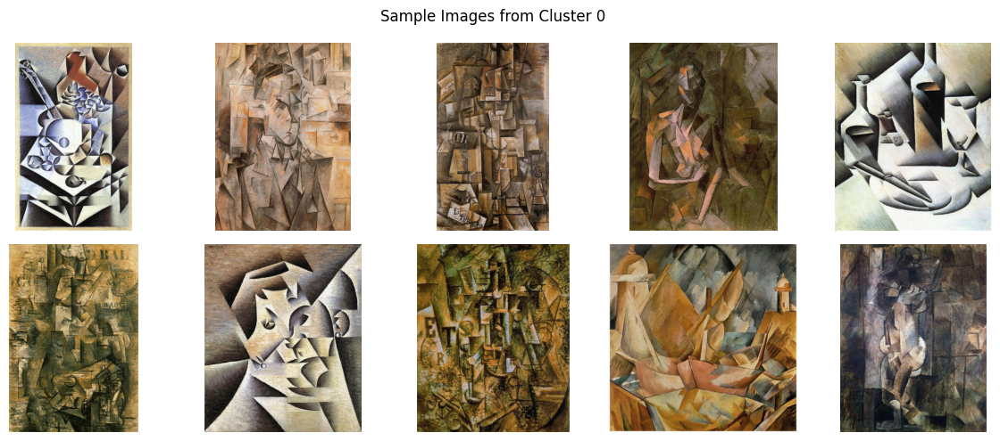

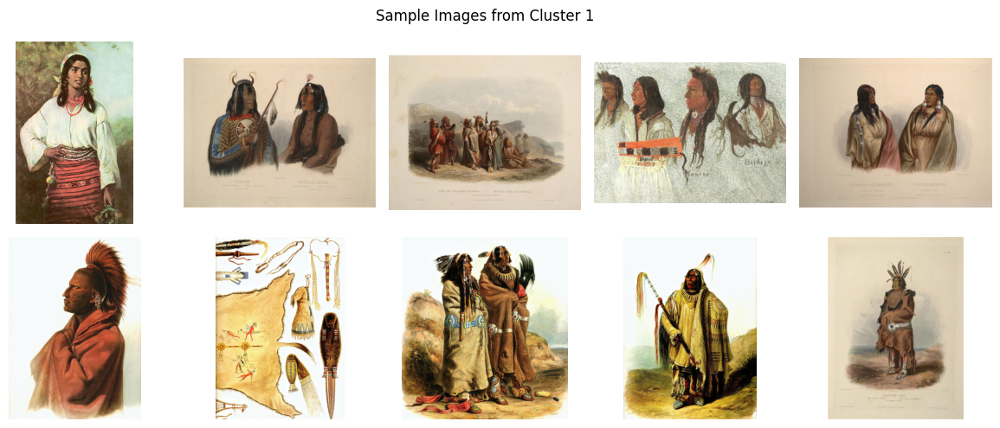

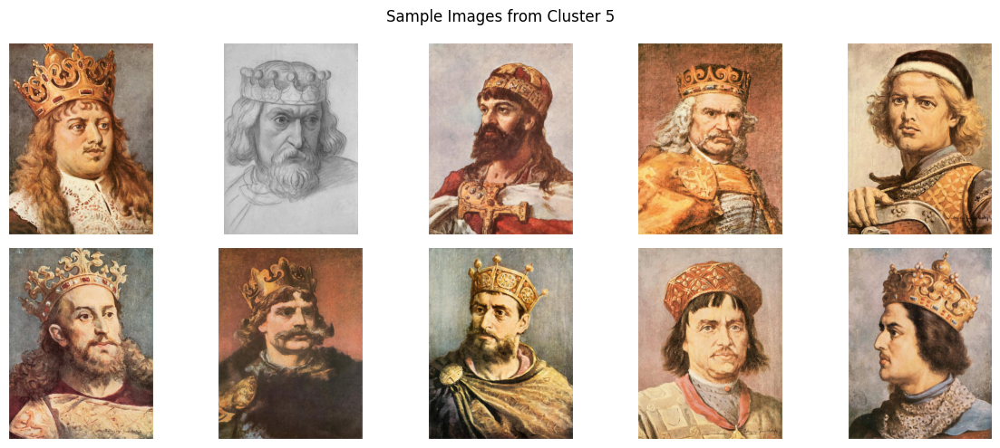

In [ ]:
def show_cluster(cluster_id, max_images=10):
    cluster_paths = df[df["cluster"] == str(cluster_id)]["path"].tolist()[:max_images]

    fig, axes = plt.subplots(2, 5, figsize=(12, 5))

    for ax, img_path in zip(axes.ravel(), cluster_paths):
        img = Image.open(img_path).convert("RGB")
        ax.imshow(img)
        ax.axis("off")

    plt.suptitle(f"Sample Images from Cluster {cluster_id}")
    plt.tight_layout()
    plt.show()

show_cluster(0)
show_cluster(1)
show_cluster(5)

## Hyperparameter Tuning

In [ ]:
# Tuning
from itertools import product
from sklearn.metrics import silhouette_score
from sklearn.manifold import trustworthiness

X = embeddings

param_grid = {
    # UMAP parameters
    'n_components': [2, 3, 5, 10],
    'n_neighbors': [5, 15, 30],
    'min_dist': [0.0, 0.05, 0.1],

    # HDBSCAN parameters
    'min_cluster_size': [3, 5, 10, 20],
    'min_samples': [1, 3, 5]
}

In [ ]:
import gc
import warnings
from tqdm import tqdm

# Remove warnings
warnings.filterwarnings("ignore")

res = []

X = X.astype("float32")

param_comb = list(product(
    param_grid["n_components"],
    param_grid["n_neighbors"],
    param_grid["min_dist"],
    param_grid["min_cluster_size"],
    param_grid["min_samples"]
))

for (n_components, n_neighbors, min_dist, min_cluster_size, min_samples) in tqdm(param_comb):
    try:
        umap_model = umap.UMAP(
            n_components=n_components,
            n_neighbors=n_neighbors,
            min_dist=min_dist,
            metric="cosine",
            random_state=42,
            low_memory=True
        )

        embedding_umap = umap_model.fit_transform(X)

        # Cluster reduced features with HDBSCAN
        cluster_reduced = hdbscan.HDBSCAN(
            min_cluster_size=min_cluster_size,
            min_samples=min_samples,
            cluster_selection_method="leaf"
        )

        labels = cluster_reduced.fit_predict(embedding_umap)

        # Count number of real clusters, ignoring noise label -1
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Measure how many points marked as noise
        noise_ratio = np.mean(labels == -1)

        # Compute silhouette on non-noise points
        mask = labels != -1

        if np.sum(mask) > 1 and len(set(labels[mask])) > 1:
            silhouette = silhouette_score(embedding_umap[mask], labels[mask])
        else:
            silhouette = -1

        tw_score = trustworthiness(X, embedding_umap, n_neighbors=10)

        # Combined score:
        # higher silhouette = better clusters
        # lower noise ratio = better coverage
        # higher trustworthiness = better UMAP preservation
        score = silhouette - 0.5 * noise_ratio + 0.2 * tw_score + 0.3 * np.log1p(n_clusters)

        res.append({
            'n_components': n_components,
            'n_neighbors': n_neighbors,
            'min_dist': min_dist,
            'min_cluster_size': min_cluster_size,
            'min_samples': min_samples,
            'n_clusters': n_clusters,
            'noise_ratio': noise_ratio,
            'silhouette': silhouette,
            'trustworthiness': tw_score,
            'score': score
        })

    except MemoryError:
        print("Memory error:", n_components, n_neighbors, min_dist, min_cluster_size, min_samples)

    finally:
        for obj in ["umap_model", "embedding_umap", "cluster_reduced", "labels"]:
            if obj in locals():
                del locals()[obj]
        gc.collect()

100%|██████████| 432/432 [1:43:47<00:00, 14.42s/it]


In [ ]:
res_df = pd.DataFrame(res)

# Remove bad results
res_df = res_df[
    (res_df['n_clusters'] > 1) &
    (res_df['noise_ratio'] < 0.9)
]

res_df = res_df.sort_values(by='score', ascending=False)
res_df

,n_components,n_neighbors,min_dist,min_cluster_size,min_samples,n_clusters,noise_ratio,silhouette,trustworthiness,score
0,2,5,0.00,3,1,837,0.1910,0.538535,0.964681,2.655277
108,3,5,0.00,3,1,799,0.2064,0.530138,0.972501,2.626822
24,2,5,0.10,3,1,829,0.1806,0.497974,0.960395,2.616180
324,10,5,0.00,3,1,794,0.2078,0.520551,0.976271,2.615408
12,2,5,0.05,3,1,795,0.1966,0.511212,0.961306,2.609053
...,...,...,...,...,...,...,...,...,...,...
429,10,30,0.10,20,1,69,0.3920,0.405694,0.979241,1.680091
322,5,30,0.10,20,3,54,0.4276,0.481964,0.978291,1.666022
323,5,30,0.10,20,5,52,0.4764,0.516329,0.978291,1.664875
430,10,30,0.10,20,3,56,0.3892,0.450693,0.979241,1.664856


In [ ]:
# Apply UMAP with best hyperparameters
best_params = res_df.iloc[0]
print(best_params)

best_umap = umap.UMAP(
    n_components=int(best_params['n_components']),
    n_neighbors=int(best_params['n_neighbors']),
    min_dist=float(best_params['min_dist']),
    metric='cosine',
    random_state=42
)

embedding_best = best_umap.fit_transform(X)

cluster_best = hdbscan.HDBSCAN(
    min_cluster_size=int(best_params['min_cluster_size']),
    min_samples=int(best_params['min_samples'])
)

labels_best = cluster_best.fit_predict(embedding_best)

n_components          2.000000
n_neighbors           5.000000
min_dist              0.000000
min_cluster_size      3.000000
min_samples           1.000000
n_clusters          837.000000
noise_ratio           0.191000
silhouette            0.538535
trustworthiness       0.964681
score                 2.655277
Name: 0, dtype: float64


In [ ]:
df_res = pd.DataFrame({
    'image_path': image_paths,
    'cluster': labels_best
})

df_res

,image_path,cluster
0,wikiart_data/Analytical_Cubism/juan-gris_still...,23
1,wikiart_data/Analytical_Cubism/pablo-picasso_s...,225
2,wikiart_data/Analytical_Cubism/pablo-picasso_w...,38
3,wikiart_data/Analytical_Cubism/pablo-picasso_t...,94
4,wikiart_data/Analytical_Cubism/pablo-picasso_s...,38
...,...,...
4995,wikiart_data/Romanticism/ivan-aivazovsky_self-...,-1
4996,wikiart_data/Romanticism/eugene-delacroix_bouq...,12
4997,wikiart_data/Romanticism/karl-bodmer_chief-of-...,6
4998,wikiart_data/Romanticism/william-holman-hunt_t...,-1


In [ ]:
# Create a 3D UMAP
embedding_3d = embedding_best

if best_params['n_components'] != 3:
  umap_3d = umap.UMAP(
      n_components=3,
      n_neighbors=int(best_params['n_neighbors']),
      min_dist=float(best_params['min_dist']),
      metric='cosine',
      random_state=42
  )

  embedding_3d = umap_3d.fit_transform(X)

labels_3d = cluster_best.fit_predict(embedding_3d)

In [ ]:
# Create a 2D UMAP
embedding_2d = embedding_best

if best_params['n_components'] != 2:
  umap_2d = umap.UMAP(
      n_components=2,
      n_neighbors=int(best_params['n_neighbors']),
      min_dist=float(best_params['min_dist']),
      metric='cosine',
      random_state=42
  )

  embedding_2d = umap_2d.fit_transform(X)

labels_2d = cluster_best.fit_predict(embedding_2d)

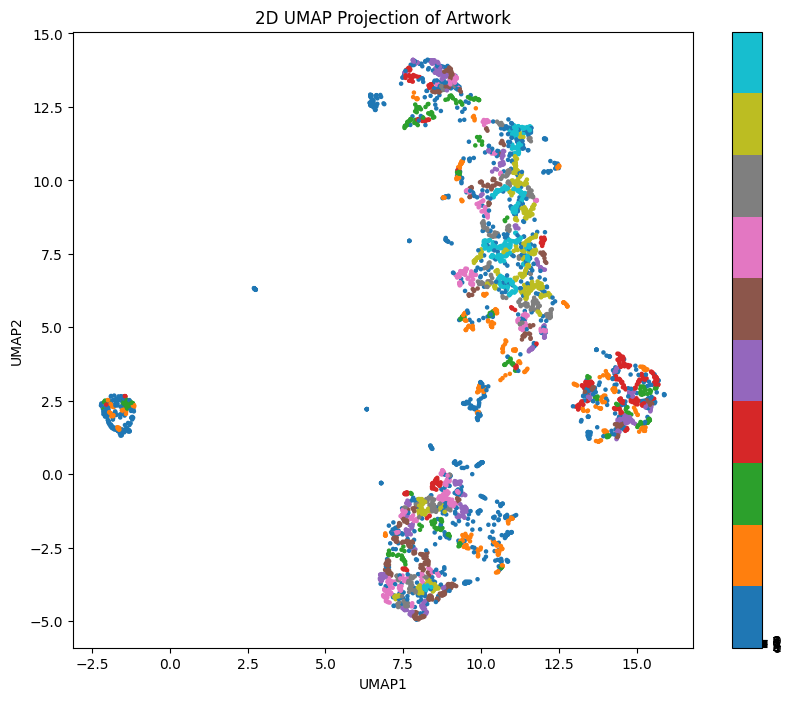

In [ ]:
# 2D visualization
plt.figure(figsize=(10, 8))
scatter = plt.scatter(
    embedding_2d[:, 0],
    embedding_2d[:, 1],
    c=labels_2d,
    cmap="tab10",
    s=5
)

plt.colorbar(scatter, ticks=range(10))
plt.title("2D UMAP Projection of Artwork")
plt.xlabel("UMAP1")
plt.ylabel("UMAP2")
plt.show()

In [ ]:
# 3D Interactive Plot
umap_3d_df = pd.DataFrame({
    "UMAP1": embedding_3d[:, 0],
    "UMAP2": embedding_3d[:, 1],
    "UMAP3": embedding_3d[:, 2],
    "cluster": labels_3d.astype(str),
    "image_path": image_paths
})


fig = px.scatter_3d(umap_3d_df, x='UMAP1', y='UMAP2', z='UMAP3',
                    color='cluster', hover_data=['image_path'],
                    title="UMAP 3D Interactive Plot of Artwork Clusters",
                    opacity=0.7, width=1000, height=800)

fig.show()

Display 5-10 images for randomly choose 5 clusters (Default to display 6 images)

In [ ]:
import random

def show_cluster(cluster_id, n=6):
    idx = [i for i, c in enumerate(labels_3d) if c == cluster_id]
    sample = random.sample(idx, min(n, len(idx)))

    plt.figure(figsize=(10, 5))
    for i, j in enumerate(sample):
        plt.subplot(2, 3, i+1)
        img = Image.open(image_paths[j])
        plt.imshow(img)
        plt.axis('off')
    plt.suptitle(f"Cluster {cluster_id}")
    plt.show()

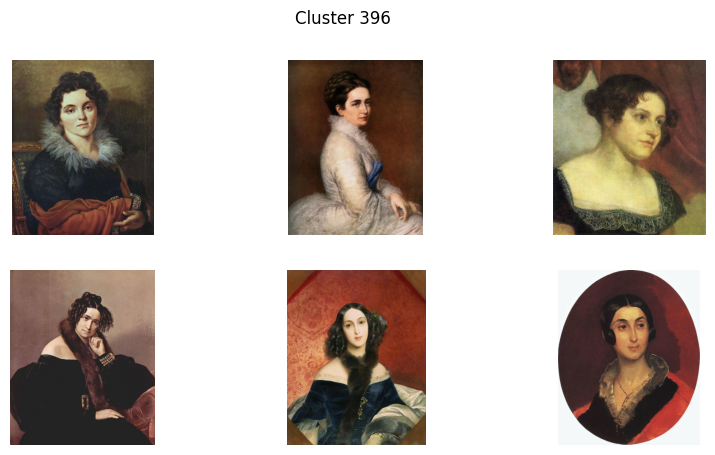

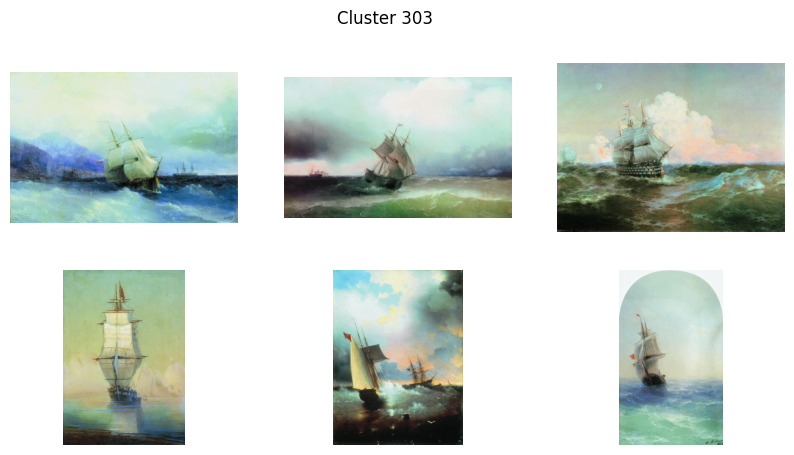

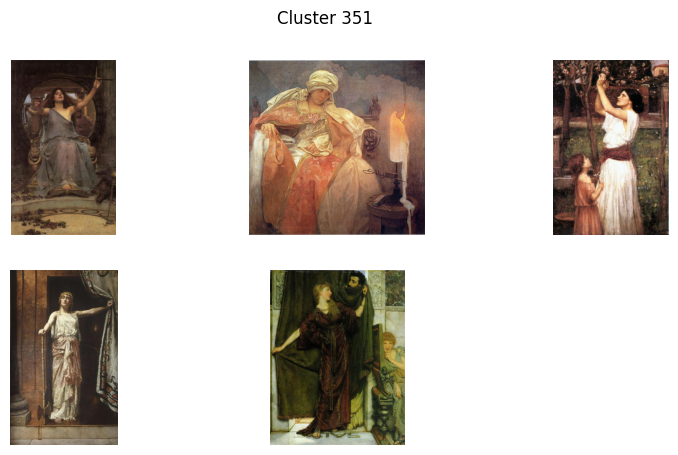

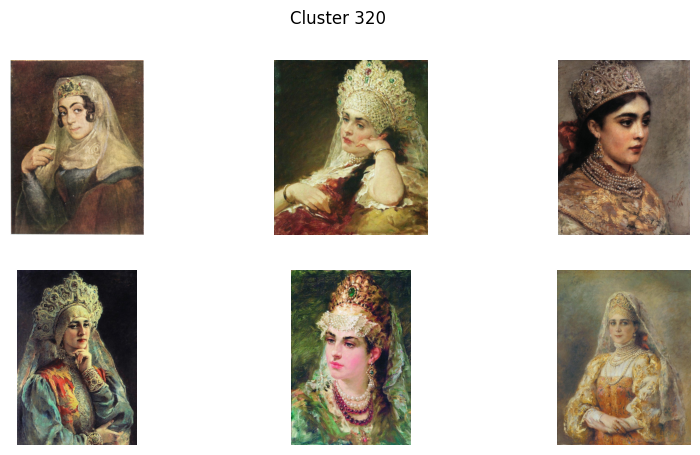

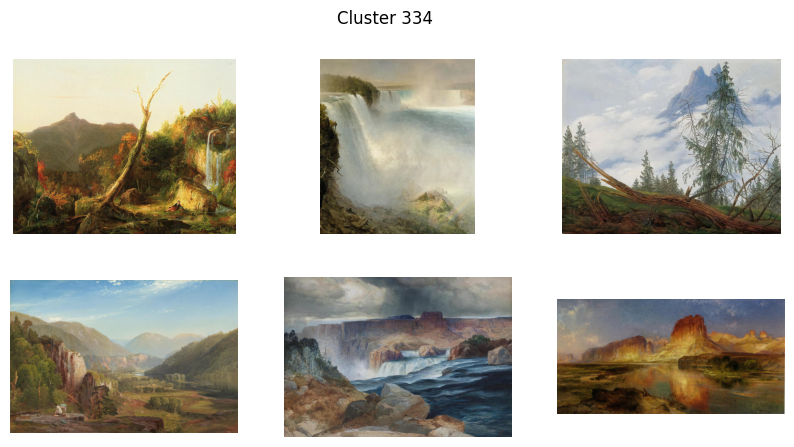

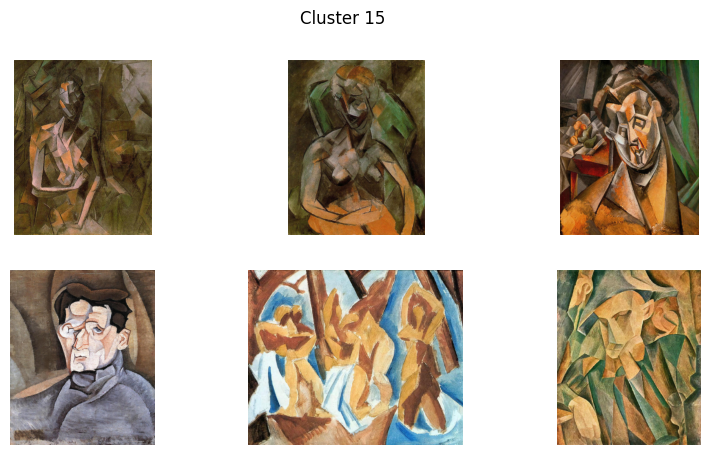

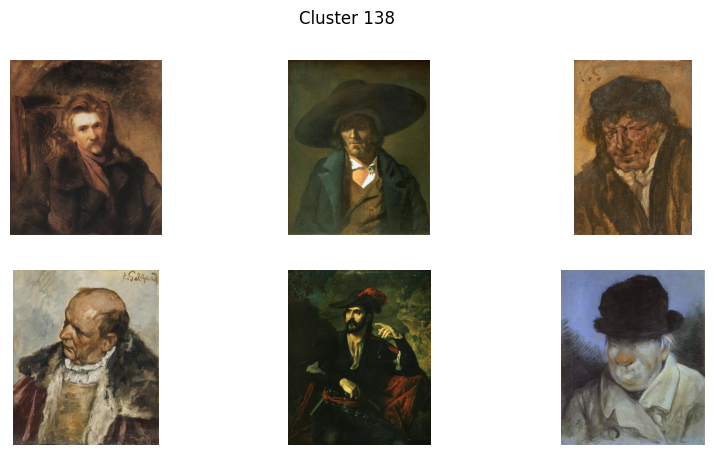

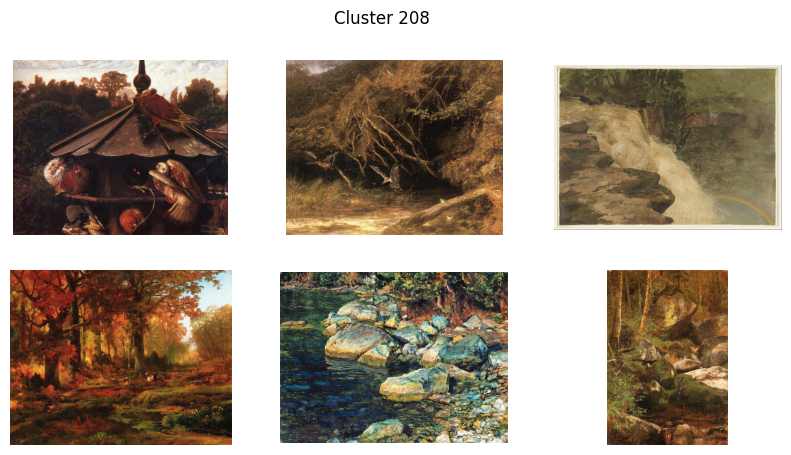

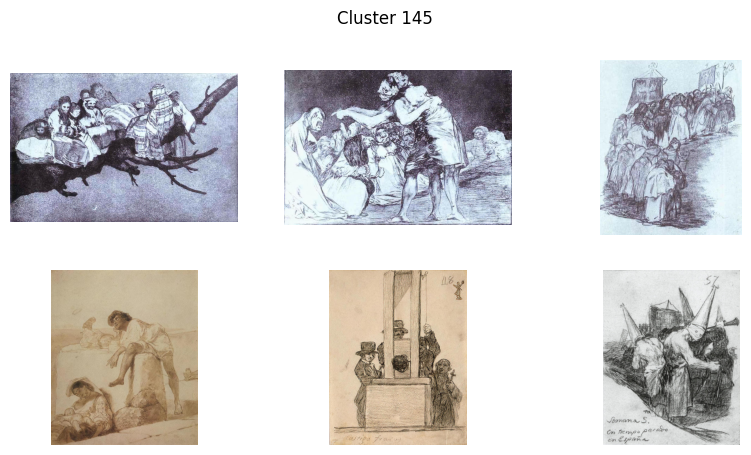

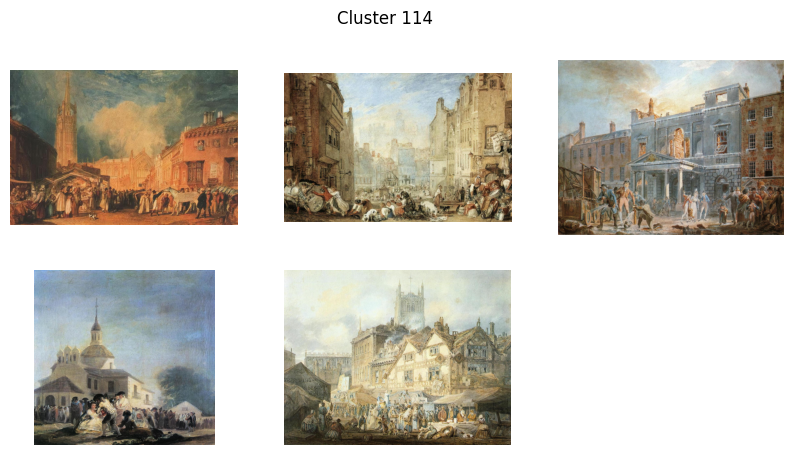

In [ ]:
clean_clusters = [c for c in set(labels_best) if c != -1]

num_clusters = random.sample(clean_clusters, min(10, len(set(labels_best))))

for n in num_clusters:
  show_cluster(n)

Export for Godot (simpler set)

In [ ]:
from sklearn.preprocessing import normalize
from sklearn.cluster import KMeans
import pandas as pd
import os

# normalize the CLIP embeddings you already computed
X_norm = normalize(embeddings, norm="l2")

# cluster in feature space
kmeans = KMeans(n_clusters=5, random_state=42, n_init=10)
cluster_labels = kmeans.fit_predict(X_norm)

print("Cluster counts:")
print(pd.Series(cluster_labels).value_counts().sort_index())

# export for Godot
scale = 5.0
df = pd.DataFrame({
    "id": range(len(valid_image_paths)),
    "x": embedding_3d[:, 0] * scale,
    "y": embedding_3d[:, 1] * scale,
    "z": embedding_3d[:, 2] * scale,
    "image": [os.path.basename(p) for p in valid_image_paths],
    "filename": [os.path.basename(p) for p in valid_image_paths],
    "cluster": cluster_labels
})

df.to_json("artwork_map.json", orient="records", indent=2)
print("Saved artwork_map.json")